<a href="https://colab.research.google.com/github/lismalejo/APPConversor/blob/main/SistemaECG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

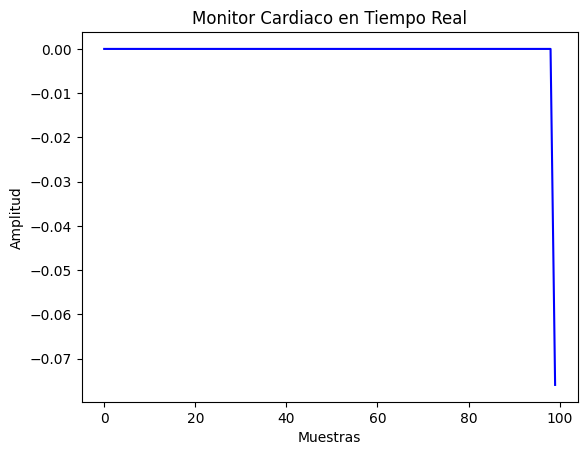

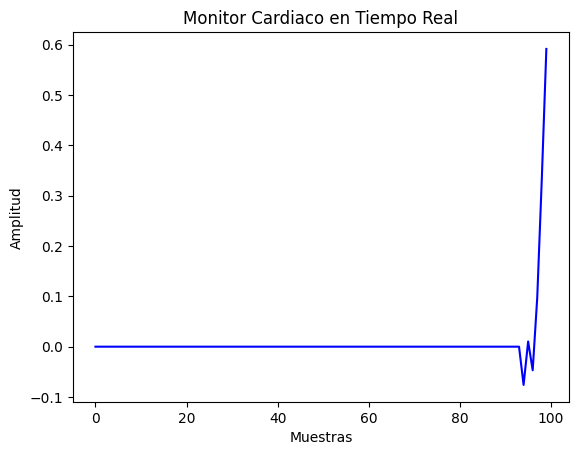

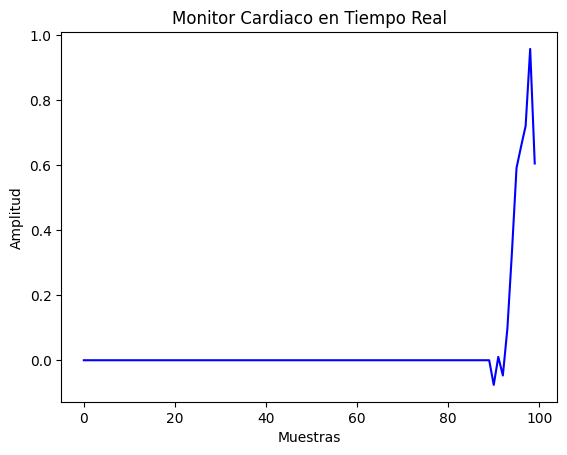

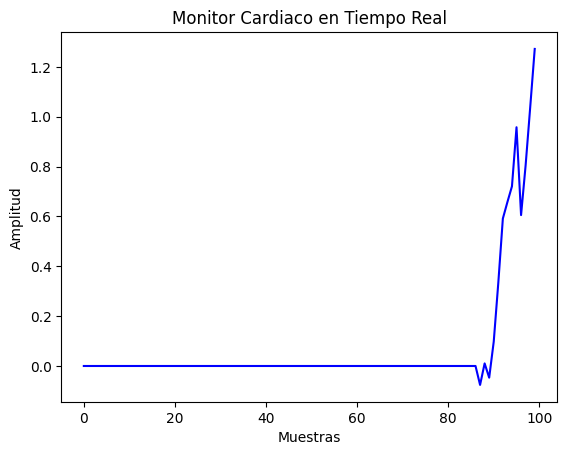

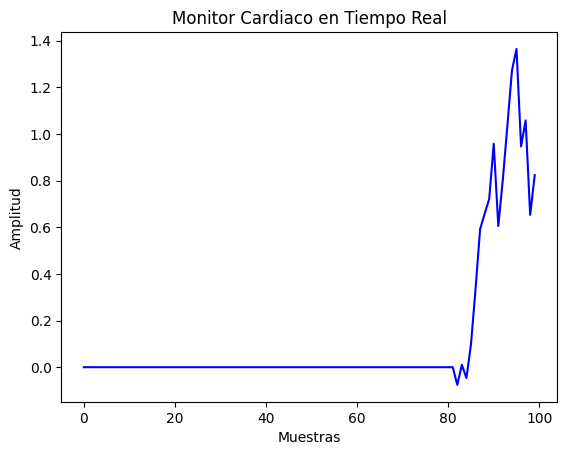

...

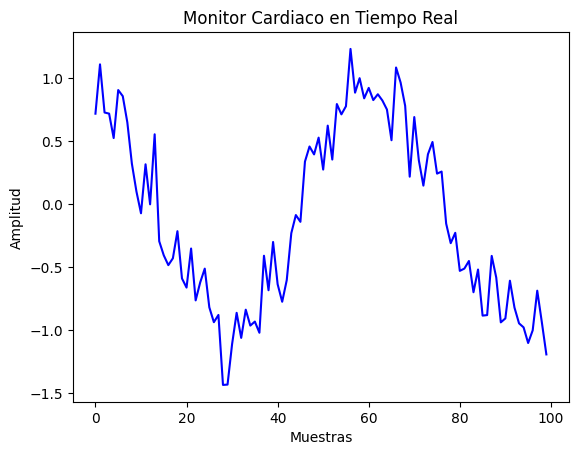

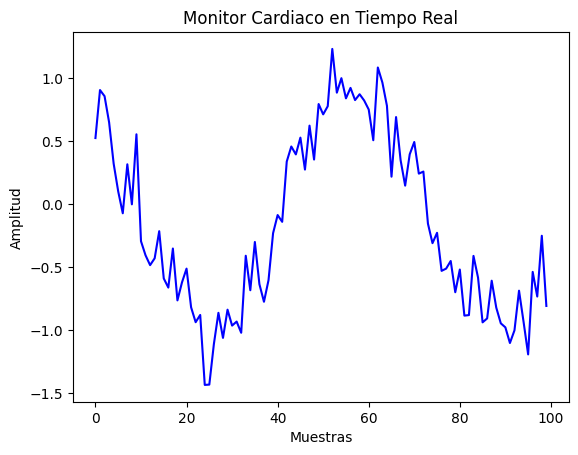

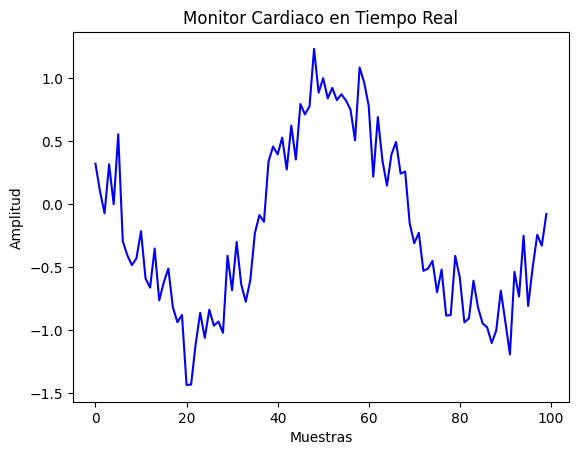

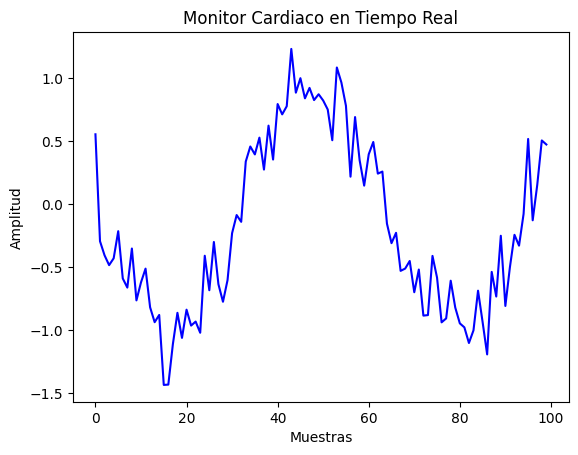

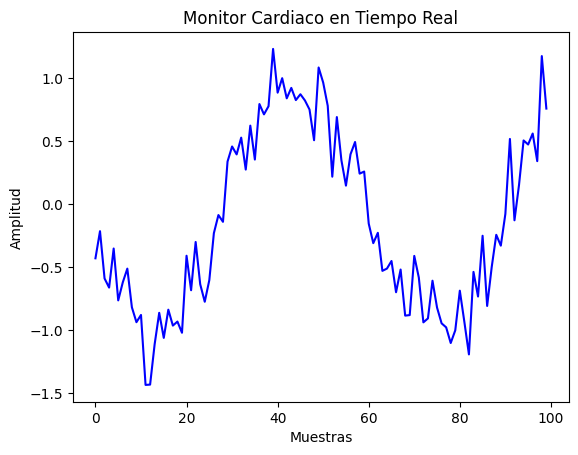


Monitoreo detenido por el usuario.


In [ ]:
import threading
import time
import numpy as np
import matplotlib.pyplot as plt

class SistemaMonitoreoCardiaco:
    def __init__(self):
        self.datos_ecg = np.zeros(100)  # Datos simulados del Electrocardiograma
        self.detener_hilo = False

    def adquirir_datos_ecg(self):
        tiempo = 0
        while not self.detener_hilo:
            # Simulación: Generar datos del Electrocardiograma
            nuevo_dato = np.sin(tiempo) + np.random.normal(0, 0.2)
            self.datos_ecg = np.append(self.datos_ecg[1:], nuevo_dato)

            # Dormir para simular la frecuencia de muestreo
            time.sleep(0.1)
            tiempo += 0.1

    def visualizar_ecg(self):
        while not self.detener_hilo:
            # Visualizar datos del Electrocardiograma en tiempo real
            plt.plot(self.datos_ecg, color='blue')
            plt.title('Monitor Cardiaco en Tiempo Real')
            plt.xlabel('Muestras')
            plt.ylabel('Amplitud')
            plt.pause(0.1)
            plt.clf()  # Limpiar el gráfico

    def iniciar_monitoreo(self):
        # Crear hilos para la adquisición y visualización en tiempo real
        hilo_adquisicion = threading.Thread(target=self.adquirir_datos_ecg)
        hilo_visualizacion = threading.Thread(target=self.visualizar_ecg)

        # Iniciar los hilos
        hilo_adquisicion.start()
        hilo_visualizacion.start()

        # Esperar a que los hilos terminen (esto no sucederá en este ejemplo)
        hilo_adquisicion.join()
        hilo_visualizacion.join()

    def detener_monitoreo(self):
        self.detener_hilo = True

if __name__ == "__main__":
    sistema_monitoreo = SistemaMonitoreoCardiaco()

    try:
        # Iniciar el monitoreo
        sistema_monitoreo.iniciar_monitoreo()
    except KeyboardInterrupt:
        # Manejar la interrupción del teclado (Ctrl+C)
        sistema_monitoreo.detener_monitoreo()
        print("\nMonitoreo detenido por el usuario.")
